<a href="https://colab.research.google.com/github/Untick/IrisID_gr1/blob/Sergei-Boykov-folder/Sergei%20Boykov/Iris_IDentification_Zenica_LLC_v_2_4_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Идентификация пациента по радужной оболочке глаза (Iris ID)**

# Загрузка библиотек

In [9]:
# Работа с массивами
import numpy as np

# Генератор аугментированных изображений
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Основа для создания последовательной модели
from tensorflow.keras.models import Sequential

# Основные слои
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, BatchNormalization

# Оптимизатор
from tensorflow.keras.optimizers import Adam

# Матрица ошибок классификатора
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Подключение модуля для загрузки данных из облака
import gdown

# Инструменты для работы с файлами
import os

# Для работы с архивами
import zipfile

# Отрисовка графиков
import matplotlib.pyplot as plt

# Модуль для работы с файлами и папками
import shutil

# Библиотека для работы с изображениями
from PIL import Image

# Рисование графиков в ячейках Colab
%matplotlib inline

# Гиперпараметры

In [10]:
# Задание гиперпараметров

TRAIN_PATH          = '/content/iris'       # Папка для обучающего набора данных
TEST_PATH           = '/content/iris_test'  # Папка для тестового набора данных

TEST_SPLIT          = 0.2                   # Доля тестовых данных в общем наборе
VAL_SPLIT           = 0.2                   # Доля проверочной выборки в обучающем наборе

IMG_WIDTH           = 768                   # Ширина изображения для нейросети (по умолчанию 768)
IMG_HEIGHT          = 576                   # Высота изображения для нейросети (по умолчанию 576)
IMG_CHANNELS        = 3                     # Количество каналов (для RGB равно 3, для Grey равно 1)

# Параметры аугментации
ROTATION_RANGE      = 5                     # Пределы поворота
WIDTH_SHIFT_RANGE   = 0.05                  # Пределы сдвига по горизонтали
HEIGHT_SHIFT_RANGE  = 0.05                  # Пределы сдвига по вертикали
ZOOM_RANGE          = 0.05                  # Пределы увеличения/уменьшения
BRIGHTNESS_RANGE    = (0.8, 1.2)            # Пределы изменения яркости
HORIZONTAL_FLIP     = True                  # Горизонтальное отражение разрешено

EPOCHS_INITIAL      = 330                   # Число эпох для первоначального обучения
EPOCHS_ADD          = 144                   # Число эпох для до-обучения
BATCH_SIZE          = 8                     # Размер батча для обучения модели
OPTIMIZER           = Adam(0.0001)          # Оптимизатор

CLASS_COUNT_INITIAL = 64                    # Начальное количество классов для обучения с нуля
CLASS_COUNT_ADD = 25                        # Дополнительное количество классов для до-обучения

# ======================= 64 класса =======================

# Подготовка данных для первоначального обучения модели на 64 классах

### Сервисные функции

In [5]:
import gdown
import os
import zipfile
import shutil
from PIL import Image


def extract_zip(zip_path, extract_path):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)

def move_files(source_path, destination_folder):
    for file_name in os.listdir(source_path):
        if file_name.endswith('.jpg') or file_name.endswith('.png'):
            shutil.move(os.path.join(source_path, file_name), destination_folder)

def process_initial_archive():
    zip_path = '/content/Iris_ID.zip'
    extract_path = TRAIN_PATH

    if os.path.exists(extract_path):
        shutil.rmtree(extract_path)

    os.makedirs(extract_path)

    with zipfile.ZipFile(zip_path, 'r') as main_zip:
        for archive_name in main_zip.namelist():
            if 'iris' in archive_name:
                with main_zip.open(archive_name) as archive_file:
                    with zipfile.ZipFile(archive_file, 'r') as archive:
                        archive.extractall(path=extract_path)

                        for i in range(1, 65):
                            class_folder = os.path.join(extract_path, f'{i:03}')
                            if not os.path.exists(class_folder):
                                os.makedirs(class_folder)
                            for file_name in ['%03dL_%d.png' % (i, j) for j in range(1, 4)] + ['%03dR_%d.png' % (i, j) for j in range(1, 4)]:
                                file_path = os.path.join(extract_path, file_name)
                                if os.path.exists(file_path):
                                    os.replace(file_path, os.path.join(class_folder, file_name))

def process_add_archive():
    zip_path = '/content/1920x1080.zip'
    extract_path = TRAIN_PATH

    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)

    class_start = CLASS_COUNT_INITIAL + 1
    class_end = class_start + CLASS_COUNT_ADD
    for i in range(class_start, class_end):
        class_folder = str(i).zfill(3)
        left_full_path = os.path.join(extract_path, '1920x1080', str(i-64), 'left', 'full')
        right_full_path = os.path.join(extract_path, '1920x1080', str(i-64), 'right', 'full')
        destination_folder = os.path.join(extract_path, class_folder)

        os.makedirs(destination_folder, exist_ok=True)

        move_files(left_full_path, destination_folder)
        move_files(right_full_path, destination_folder)

    folder_to_delete = os.path.join(extract_path, '1920x1080')
    shutil.rmtree(folder_to_delete)

# Загрузка zip-архива с датасетом Iris_ID с первоначальными классами
def download_initial_archive():
    gdown.download('https://drive.google.com/uc?id=1iyivghCsMK9K6VBgknx4ydFsLQEtmupQ', None, quiet=True)

# Загрузка zip-архива с датасетом 1920x1080 с дополнительными классами
def download_add_archive():
    gdown.download('https://drive.google.com/uc?id=1tmoUbV71JQbDkEz6VQeJZ24cT72YZX-p', None, quiet=True)

# Функция для обработки архивов в зависимости от выбора пользователя
def process_archives(arh_initial=True, arh_add=True):
    if arh_initial:
        download_initial_archive()
        process_initial_archive()

    if arh_add:
        download_add_archive()
        process_add_archive()

# Функция для удаления указанных путей
def remove_paths(train_path=False, test_path=False):
    if train_path and os.path.exists(TRAIN_PATH):
        shutil.rmtree(TRAIN_PATH)
    if test_path and os.path.exists(TEST_PATH):
        shutil.rmtree(TEST_PATH)

# Функция изменения размера изображений в папке folder_path
def resize_images(root_folder, new_width, new_height):
    # Проход по всем папкам
    for folder_name in os.listdir(root_folder):
        folder_path = os.path.join(root_folder, folder_name)

        # Проверка, что текущий элемент является папкой
        if os.path.isdir(folder_path):
            # Проход по всем файлам в папке
            for file_name in os.listdir(folder_path):
                file_path = os.path.join(folder_path, file_name)

                # Проверка, что текущий элемент является файлом изображения
                if os.path.isfile(file_path) and (file_name.endswith('.jpg') or file_name.endswith('.png')):
                    # Открытие изображения
                    image = Image.open(file_path)

                    # Проверка разрешения изображения
                    if image.width != new_width or image.height != new_height:
                        # Изменение размера изображения
                        resized_image = image.resize((new_width, new_height))

                        # Сохранение измененного изображения в том же файле
                        resized_image.save(file_path)

                    # Закрытие изображения
                    image.close()

# Функция переноса файлов для теста в отдельное дерево папок, расчет размеров наборов данных
def split_data_for_test(train_path, test_path, class_list, test_split, split_mode=2):
    os.mkdir(test_path)  # Создание папки для тестовых данных
    train_count = 0
    test_count = 0

    for class_name in class_list:  # Для всех классов по порядку номеров (их меток)
        class_path = os.path.join(train_path, class_name)  # Формирование полного пути к папке с изображениями класса
        test_class_path = os.path.join(test_path, class_name)  # Полный путь для тестовых данных класса
        class_files = os.listdir(class_path)  # Получение списка имен файлов с изображениями текущего класса
        class_files.sort()  # Сортировка имен файлов по алфавиту
        class_file_count = len(class_files)  # Получение общего числа файлов класса
        os.mkdir(test_class_path)  # Создание подпапки класса для тестовых данных

        if split_mode == 1:
            test_file_count = int(round(class_file_count * test_split))  # Определение числа тестовых файлов для класса

            left_start = int(class_file_count / 2 - test_file_count / 2)
            left_end = int(class_file_count / 2)
            right_start = int(class_file_count - test_file_count / 2)
            right_end = class_file_count
            test_files1 = class_files[left_start:left_end]        # 1-ое выделение файлов для теста
            test_files2 = class_files[right_start:right_end]      # 2-ое выделение файлов для теста
            test_files = test_files1 + test_files2                # объединяем оба списка
        elif split_mode == 2:
            test_file_count = int(class_file_count * test_split)  # Определение числа тестовых файлов для класса
            test_files = class_files[-test_file_count:]           # Выделение файлов для теста от конца списка

        for f in test_files:  # Перемещение тестовых файлов в папку для теста
            os.rename(os.path.join(class_path, f), os.path.join(test_class_path, f))
        train_count += class_file_count  # Увеличение общего счетчика файлов обучающего набора
        test_count += test_file_count  # Увеличение общего счетчика файлов тестового набора

        print(f'Размер класса {class_name}: {class_file_count} фото, для теста выделено файлов: {test_file_count}')

    print(f'Общий размер базы: {train_count}, выделено для обучения: {train_count - test_count}, для теста: {test_count}')

    return test_count

### Загрузка и обработка архива Iris_ID.zip (64 класса)

In [ ]:
# Очистка данных от прошлого запуска (если есть)
remove_paths(train_path=True, test_path=True)

In [ ]:
# Загрузка и обработка архива Iris_ID.zip
process_archives(arh_initial=True, arh_add=False)

In [ ]:
# Изменение размера изображений в папке
folder_path = f'{TRAIN_PATH}'
new_width = IMG_WIDTH
new_height = IMG_HEIGHT

resize_images(folder_path, new_width, new_height)

In [ ]:
# Определение списка имен классов
CLASS_LIST = sorted(os.listdir(TRAIN_PATH))

# Определение количества классов
CLASS_COUNT = len(CLASS_LIST)

# Проверка результата
print(f'Количество классов: {CLASS_COUNT}, метки классов: {CLASS_LIST}')

Количество классов: 64, метки классов: ['001', '002', '003', '004', '005', '006', '007', '008', '009', '010', '011', '012', '013', '014', '015', '016', '017', '018', '019', '020', '021', '022', '023', '024', '025', '026', '027', '028', '029', '030', '031', '032', '033', '034', '035', '036', '037', '038', '039', '040', '041', '042', '043', '044', '045', '046', '047', '048', '049', '050', '051', '052', '053', '054', '055', '056', '057', '058', '059', '060', '061', '062', '063', '064']


In [ ]:
# Очистка TEST_PATH от прошлого запуска (если есть)
remove_paths(train_path=False, test_path=True)

# Перенос файлов для теста в отдельное дерево папок, расчет размеров наборов данных
test_count = split_data_for_test(TRAIN_PATH, TEST_PATH, CLASS_LIST, TEST_SPLIT, split_mode=2)

Размер класса 001: 6 фото, для теста выделено файлов: 1
Размер класса 002: 6 фото, для теста выделено файлов: 1
Размер класса 003: 6 фото, для теста выделено файлов: 1
Размер класса 004: 6 фото, для теста выделено файлов: 1
Размер класса 005: 6 фото, для теста выделено файлов: 1
Размер класса 006: 6 фото, для теста выделено файлов: 1
Размер класса 007: 6 фото, для теста выделено файлов: 1
Размер класса 008: 6 фото, для теста выделено файлов: 1
Размер класса 009: 6 фото, для теста выделено файлов: 1
Размер класса 010: 6 фото, для теста выделено файлов: 1
Размер класса 011: 6 фото, для теста выделено файлов: 1
Размер класса 012: 6 фото, для теста выделено файлов: 1
Размер класса 013: 6 фото, для теста выделено файлов: 1
Размер класса 014: 6 фото, для теста выделено файлов: 1
Размер класса 015: 6 фото, для теста выделено файлов: 1
Размер класса 016: 6 фото, для теста выделено файлов: 1
Размер класса 017: 6 фото, для теста выделено файлов: 1
Размер класса 018: 6 фото, для теста выделено фа

## Аугментация и формирование выборок

### Сервисные функции

In [17]:
# Функция аугментации и формирования выборок

def generate_data(train_path, test_path, 
                  img_height, img_width, 
                  batch_size, 
                  rotation_range, width_shift_range, 
                  height_shift_range, zoom_range, 
                  brightness_range, horizontal_flip, 
                  val_split, test_count):
    
    # Генераторы изображений

    # Изображения для обучающего набора нормализуются и аугментируются согласно заданным гиперпараметрам
    # Далее набор будет разделен на обучающую и проверочную выборку в соотношении VAL_SPLIT
    train_datagen = ImageDataGenerator(
                        rescale=1. / 255.,
                        rotation_range=ROTATION_RANGE,
                        width_shift_range=WIDTH_SHIFT_RANGE,
                        height_shift_range=HEIGHT_SHIFT_RANGE,
                        zoom_range=ZOOM_RANGE,
                        brightness_range=BRIGHTNESS_RANGE,
                        horizontal_flip=HORIZONTAL_FLIP,
                        validation_split=VAL_SPLIT
                    )

    # Изображения для тестового набора только нормализуются
    test_datagen = ImageDataGenerator(
                      rescale=1. / 255.
                    )
    
    # Обучающая выборка генерируется из папки обучающего набора
    train_generator = train_datagen.flow_from_directory(
        # Путь к обучающим изображениям
        train_path,
        # Параметры требуемого размера изображения
        target_size=(img_height, img_width),
        # Размер батча
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=True,
        # Указание сгенерировать обучающую выборку
        subset='training'
    )

    # Проверочная выборка также генерируется из папки обучающего набора
    validation_generator = train_datagen.flow_from_directory(
        train_path,
        target_size=(img_height, img_width),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=True,
        # Указание сгенерировать проверочную выборку
        subset='validation'
    )

    # Тестовая выборка генерируется из папки тестового набора
    test_generator = test_datagen.flow_from_directory(
        test_path,
        target_size=(img_height, img_width),
        batch_size=test_count,
        class_mode='categorical',
        shuffle=True,
    )

    return train_generator, validation_generator, test_generator


### Генерация изображений

In [ ]:
# Генерация изображений
train_generator, validation_generator, test_generator = generate_data(TRAIN_PATH, TEST_PATH, 
                                                                      IMG_HEIGHT, IMG_WIDTH,
                                                                      BATCH_SIZE, 
                                                                      ROTATION_RANGE, WIDTH_SHIFT_RANGE,
                                                                      HEIGHT_SHIFT_RANGE, ZOOM_RANGE, 
                                                                      BRIGHTNESS_RANGE, HORIZONTAL_FLIP, 
                                                                      VAL_SPLIT, test_count)

# Проверка формы данных
print()
print(f'Формы данных тренировочной выборки: {train_generator[0][0].shape}, {train_generator[0][1].shape}, батчей: {len(train_generator)}')
print(f'Формы данных проверочной выборки: {validation_generator[0][0].shape}, {validation_generator[0][1].shape}, батчей: {len(validation_generator)}')
print(f'Формы данных тестовой выборки: {test_generator[0][0].shape}, {test_generator[0][1].shape}, батчей: {len(test_generator)}')

print()

# Проверка назначения меток классов
print(f'Метки классов тренировочной выборки: {train_generator.class_indices}')
print(f'Метки классов проверочной выборки: {validation_generator.class_indices}')
print(f'Метки классов тестовой выборки: {test_generator.class_indices}')


Found 256 images belonging to 64 classes.
Found 64 images belonging to 64 classes.
Found 64 images belonging to 64 classes.

Формы данных тренировочной выборки: (8, 576, 768, 3), (8, 64), батчей: 32
Формы данных проверочной выборки: (8, 576, 768, 3), (8, 64), батчей: 8
Формы данных тестовой выборки: (64, 576, 768, 3), (64, 64), батчей: 1

Метки классов тренировочной выборки: {'001': 0, '002': 1, '003': 2, '004': 3, '005': 4, '006': 5, '007': 6, '008': 7, '009': 8, '010': 9, '011': 10, '012': 11, '013': 12, '014': 13, '015': 14, '016': 15, '017': 16, '018': 17, '019': 18, '020': 19, '021': 20, '022': 21, '023': 22, '024': 23, '025': 24, '026': 25, '027': 26, '028': 27, '029': 28, '030': 29, '031': 30, '032': 31, '033': 32, '034': 33, '035': 34, '036': 35, '037': 36, '038': 37, '039': 38, '040': 39, '041': 40, '042': 41, '043': 42, '044': 43, '045': 44, '046': 45, '047': 46, '048': 47, '049': 48, '050': 49, '051': 50, '052': 51, '053': 52, '054': 53, '055': 54, '056': 55, '057': 56, '058

## Проверка работы генераторов выборок

### Сервисные функции

In [ ]:
# Функция рисования образцов изображений из заданной выборки

def show_batch(batch,                # батч с примерами
               img_range=range(8),   # диапазон номеров картинок
               figsize=(25, 8),      # размер полотна для рисования одной строки таблицы
               columns=4             # число колонок в таблице
               ):

    for i in img_range:
        ix = i % columns
        if ix == 0:
            fig, ax = plt.subplots(1, columns, figsize=figsize)
        class_label = np.argmax(batch[1][i])
        ax[ix].set_title(CLASS_LIST[class_label])
        ax[ix].imshow(batch[0][i])  
        ax[ix].axis('off')
        plt.tight_layout()

    plt.show()

### Проверка одного изображения из выборки

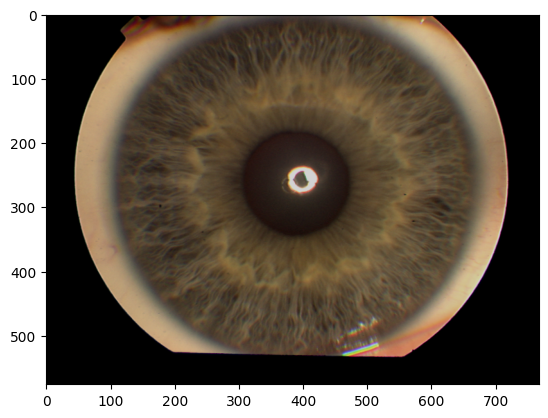

In [ ]:
# Проверка одного изображения из выборки
plt.imshow(train_generator[1][0][2])
plt.show()

### Вывод примеров из 0-го батча train_generator

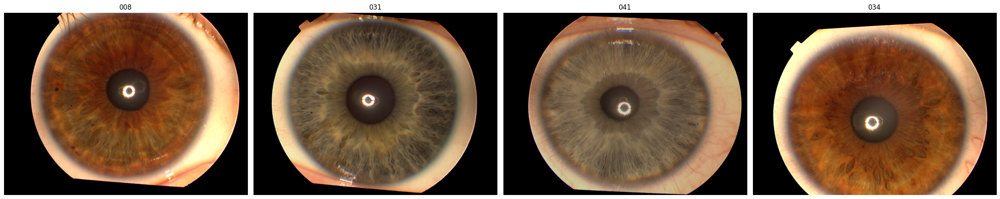

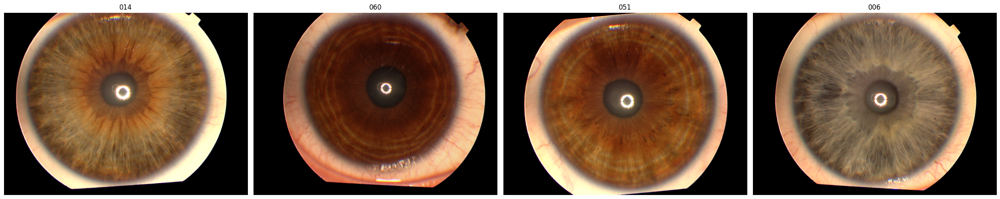

In [ ]:
# Вывод примеров из 0-го батча train_generator
show_batch(train_generator[0])

### Вывод примеров из 0-го батча validation_generator

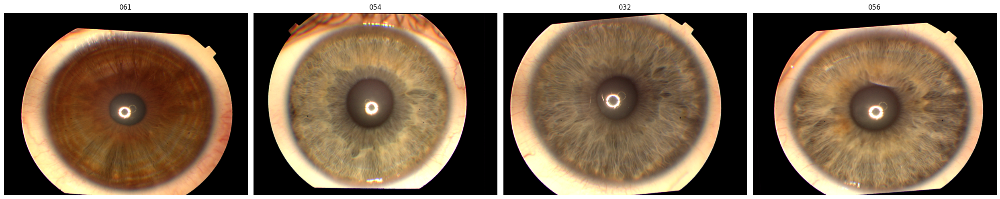

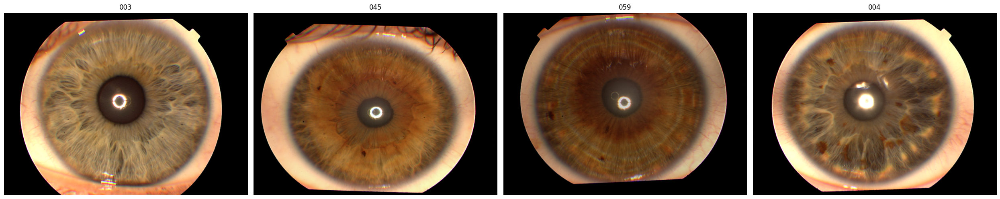

In [ ]:
# Вывод примеров из 0-го батча validation_generator
show_batch(validation_generator[0])

### Вывод примеров из 0-го (единственного) батча test_generator

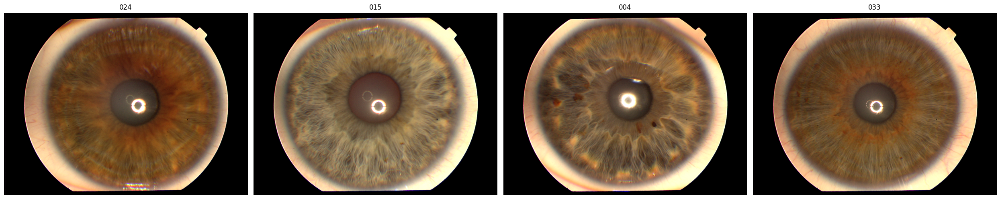

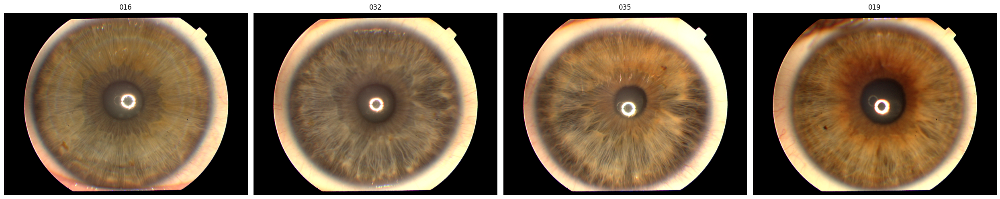

In [ ]:
# Вывод примеров из 0-го (единственного) батча test_generator
show_batch(test_generator[0])

# Создание и обучение модели нейронной сети

## Сервисные функции

In [18]:
from tensorflow.keras.callbacks import Callback

class SaveModelOnAccuracy(Callback):
    def __init__(self, filepath, monitor='val_loss', mode='min', save_best_only=True, verbose=1, min_accuracy=0.0):
        super(SaveModelOnAccuracy, self).__init__()
        self.filepath = filepath
        self.monitor = monitor
        self.mode = mode
        self.save_best_only = save_best_only
        self.verbose = verbose
        self.min_accuracy = min_accuracy
        self.best_accuracy = 0.0

    def on_epoch_end(self, epoch, logs=None):
        current_accuracy = logs.get('val_accuracy')
        if current_accuracy >= self.min_accuracy and current_accuracy > self.best_accuracy:
            self.model.save(self.filepath)
            self.best_accuracy = current_accuracy
            if self.verbose == 1:
                print(f" Модель сохранена с точностью {self.best_accuracy * 100:.2f} %")

In [19]:
# Функция компиляции и обучения модели нейронной сети
# По окончанию выводит графики обучения

def compile_train_model(model,                  # модель нейронной сети
                        train_data,             # обучающие данные
                        val_data,               # проверочные данные
                        optimizer=OPTIMIZER,    # оптимизатор
                        epochs=EPOCHS_INITIAL,  # количество эпох обучения
                        batch_size=BATCH_SIZE,  # размер батча
                        figsize=(20, 5),        # размер полотна для графиков
                        min_accuracy=0.8,       # минимальное значение accuracy для сохранения модели
                        checkpoint_path='/content/Best_model/best_model.h5',
                        learning_mode='initial'):
    
    # Полный список обучаемых переменных
    #trainable_variables = model.trainable_variables

    # Передача списка обучаемых переменных оптимизатору
    #optimizer.build(trainable_variables)    

    if learning_mode != 'initial':
        from tensorflow.keras.optimizers import legacy

        # Создание оптимизатора
        optimizer = legacy.Adam()
    

    # Компиляция модели
    model.compile(optimizer=optimizer, 
                  loss='categorical_crossentropy', 
                  metrics=['accuracy'])
    
    # Вывод сводки
    # model.summary()

    # Создание обратного вызова для сохранения модели с заданным значением accuracy
    checkpoint = SaveModelOnAccuracy(filepath=checkpoint_path,
                                     monitor='val_loss',
                                     mode='min',
                                     save_best_only=True,
                                     verbose=1,
                                     min_accuracy=min_accuracy)

    # Обучение модели с заданными параметрами
    history = model.fit(train_data,
                        epochs=epochs,
                        batch_size=batch_size,
                        validation_data=val_data,
                        callbacks=[checkpoint])  # Передача обратного вызова в качестве списка)

    # Вывод графиков точности и ошибки
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    fig.suptitle('График процесса обучения модели')
    ax1.plot(history.history['accuracy'], 
               label='Доля верных ответов на обучающем наборе')
    ax1.plot(history.history['val_accuracy'], 
               label='Доля верных ответов на проверочном наборе')
    ax1.xaxis.get_major_locator().set_params(integer=True)
    ax1.set_xlabel('Эпоха обучения')
    ax1.set_ylabel('Доля верных ответов')
    ax1.legend()

    ax2.plot(history.history['loss'], 
               label='Ошибка на обучающем наборе')
    ax2.plot(history.history['val_loss'], 
               label='Ошибка на проверочном наборе')
    ax2.xaxis.get_major_locator().set_params(integer=True)
    ax2.set_xlabel('Эпоха обучения')
    ax2.set_ylabel('Ошибка')
    ax2.legend()
    plt.show()

    return history

In [20]:
# Функция вывода результатов оценки модели на заданных данных

def eval_model(model, 
               x,                # данные для предсказания модели (вход)
               y_true,           # верные метки классов в формате OHE (выход)
               class_labels=[],  # список меток классов
               cm_round=3,       # число знаков после запятой для матрицы ошибок
               title='',         # название модели
               figsize=(13, 13)  # размер полотна для матрицы ошибок
               ):
    # Вычисление предсказания сети
    y_pred = model.predict(x)
    # Построение матрицы ошибок
    cm = confusion_matrix(np.argmax(y_true, axis=1),
                          np.argmax(y_pred, axis=1),
                          normalize='true')
    # Округление значений матрицы ошибок
    cm = np.around(cm, cm_round)

    # Отрисовка матрицы ошибок
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_title(f'Нейросеть {title}: матрица ошибок нормализованная', fontsize=18)

    # Вывод полной матрицы
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
    disp.plot(ax=ax)
    ax.images[-1].colorbar.remove()       # Стирание ненужной цветовой шкалы
    fig.autofmt_xdate(rotation=45)        # Наклон меток горизонтальной оси
    plt.xlabel('Предсказанные классы', fontsize=16)
    plt.ylabel('Верные классы', fontsize=16)
    plt.show()    

    print('-'*100)
    print(f'Нейросеть: {title}')

    # Для каждого класса:
    for cls in range(len(class_labels)):
        # Определяется индекс класса с максимальным значением предсказания (уверенности)
        cls_pred = np.argmax(cm[cls])
        # Формируется сообщение о верности или неверности предсказания
        msg = 'ВЕРНО :-)' if cls_pred == cls else 'НЕВЕРНО :-('
        # Выводится текстовая информация о предсказанном классе и значении уверенности
        print('Класс: {:<20} {:3.0f}% сеть отнесла к классу {:<20} - {}'.format(class_labels[cls],
                                                                               100. * cm[cls, cls_pred],
                                                                               class_labels[cls_pred],
                                                                               msg))

    # Средняя точность распознавания определяется как среднее диагональных элементов матрицы ошибок
    print('\nСредняя точность распознавания: {:3.0f}%'.format(100. * cm.diagonal().mean()))

In [21]:
# Сохранение лучшей модели на мой Google Disk
def save_model_to_drive(model, save_path):

    from google.colab import drive
    import shutil

    # Подключение к Google Диску
    drive.mount('/content/gdrive')

    # Сохранение модели в указанную папку на Google Диск
    shutil.copyfile(model, '/content/gdrive/MyDrive/' + save_path)

In [22]:
from tensorflow.keras.models import load_model

# Загрузка лучшей модели
def load_best_model(model_path):
    # Загрузка модели из указанного файла
    best_model = load_model(model_path)
    
    return best_model

## Архитектура модели нейронной сети

In [ ]:
def create_model(class_count=CLASS_COUNT):

    model = Sequential()

    # Сверточные слои
    model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same', input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS)))
    model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(Conv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    # Полносвязные слои
    model.add(Flatten())
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(class_count, activation='softmax'))

    return model


print("CLASS_COUNT = ", CLASS_COUNT)
model = create_model(class_count=CLASS_COUNT)

model.summary()

CLASS_COUNT =  64
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 576, 768, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 576, 768, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 288, 384, 32)     0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 288, 384, 32)      0         
                                                                 
 conv2d_2 (Conv2D)           (None, 288, 384, 64)      18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 288, 384, 64)      36928     
                                      

## Обучение модели

In [ ]:

from google.colab import drive

# Подключение к Google Диску для сохранения лучшей модели
drive.mount('/content/gdrive')

# Путь к папке на Google Диске
gdrive_path = '/content/gdrive/My Drive'

# Путь для сохранения модели на Google Диск
checkpoint_path = f'{gdrive_path}/Best_model/best_model.h5'


Mounted at /content/gdrive


Epoch 1/330
32/32 [==============================] - 65s 1s/step - loss: 4.3382 - accuracy: 0.0039 - val_loss: 4.1589 - val_accuracy: 0.0000e+00
Epoch 2/330
32/32 [==============================] - 46s 1s/step - loss: 4.1592 - accuracy: 0.0195 - val_loss: 4.1589 - val_accuracy: 0.0312
Epoch 3/330
32/32 [==============================] - 44s 1s/step - loss: 4.1590 - accuracy: 0.0195 - val_loss: 4.1589 - val_accuracy: 0.0156
Epoch 4/330
32/32 [==============================] - 45s 1s/step - loss: 4.1592 - accuracy: 0.0117 - val_loss: 4.1589 - val_accuracy: 0.0000e+00
Epoch 5/330
32/32 [==============================] - 46s 1s/step - loss: 4.1591 - accuracy: 0.0195 - val_loss: 4.1589 - val_accuracy: 0.0000e+00
Epoch 6/330
32/32 [==============================] - 46s 1s/step - loss: 4.1590 - accuracy: 0.0195 - val_loss: 4.1589 - val_accuracy: 0.0000e+00
Epoch 7/330
32/32 [==============================] - 45s 1s/step - loss: 4.1589 - accuracy: 0.0273 - val_loss: 4.1588 - val_accuracy: 0.01

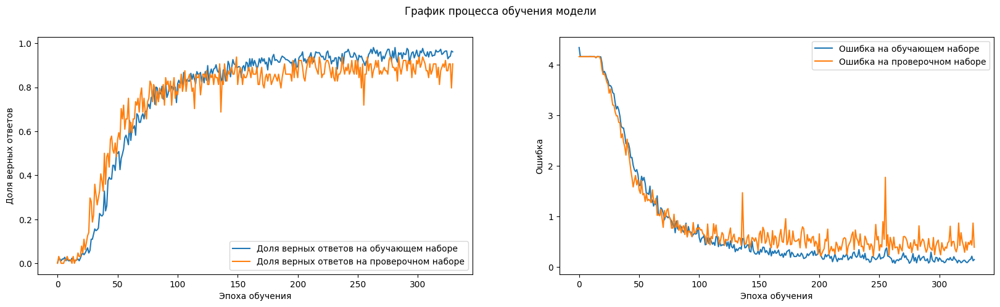

In [ ]:
# Компиляция и обучение модели на заданных параметрах
# В качестве проверочных используются тестовые данные
compile_train_model(model, 
                    train_generator,
                    validation_generator,
                    epochs=EPOCHS_INITIAL,
                    checkpoint_path=checkpoint_path,
                    learning_mode='initial')

In [ ]:
# Загрузка лучшей модели
model = load_best_model('/content/gdrive/MyDrive/Best_model/best_model.h5')

2/2 [==============================] - 16s 66ms/step


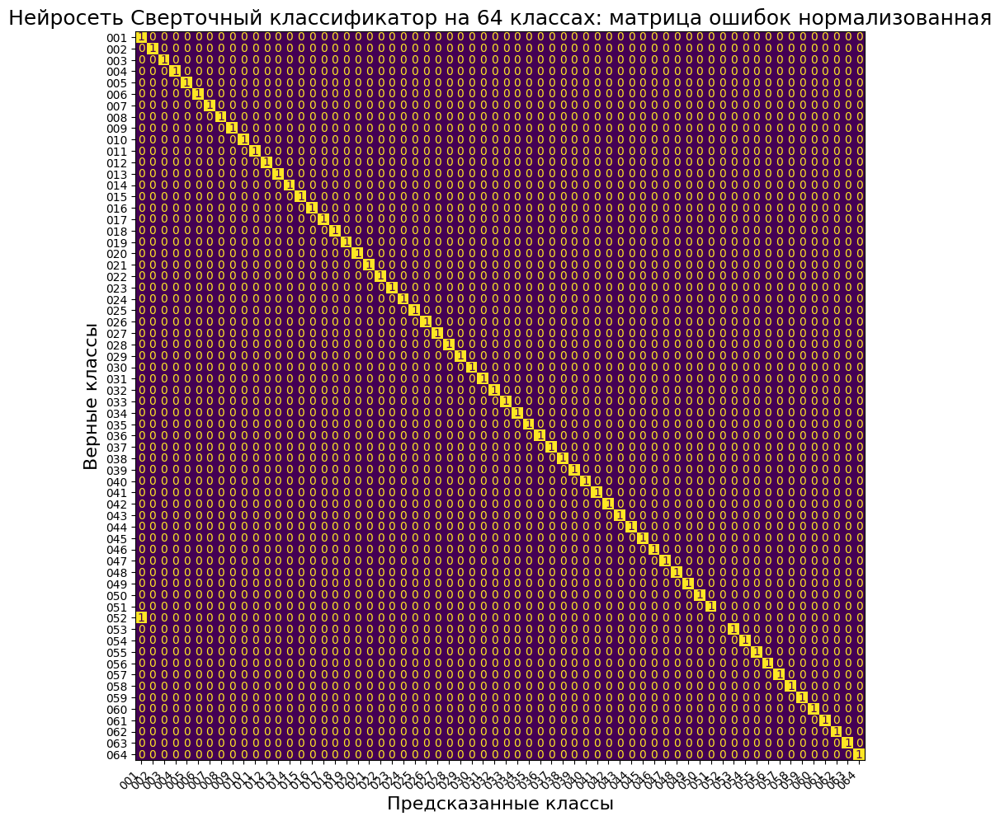

----------------------------------------------------------------------------------------------------
Нейросеть: Сверточный классификатор на 64 классах
Класс: 001                  100% сеть отнесла к классу 001                  - ВЕРНО :-)
Класс: 002                  100% сеть отнесла к классу 002                  - ВЕРНО :-)
Класс: 003                  100% сеть отнесла к классу 003                  - ВЕРНО :-)
Класс: 004                  100% сеть отнесла к классу 004                  - ВЕРНО :-)
Класс: 005                  100% сеть отнесла к классу 005                  - ВЕРНО :-)
Класс: 006                  100% сеть отнесла к классу 006                  - ВЕРНО :-)
Класс: 007                  100% сеть отнесла к классу 007                  - ВЕРНО :-)
Класс: 008                  100% сеть отнесла к классу 008                  - ВЕРНО :-)
Класс: 009                  100% сеть отнесла к классу 009                  - ВЕРНО :-)
Класс: 010                  100% сеть отнесла к классу 01

In [ ]:
# Вывод результатов оценки работы модели на тестовых данных

try:
    eval_model(model, test_generator[0][0], test_generator[0][1],
               class_labels=CLASS_LIST, 
               title=f'Сверточный классификатор на {len(CLASS_LIST)} классах')
except Exception as e:
    print('Произошла ошибка:', e)

# ======================= 89 классов =======================

# Подготовка данных для до-обучения модели на дополнительных 25 классах

### Загрузка и обработка архивов Iris_ID.zip (64 класса) и 1920x1080.zip (25 классов)

In [11]:
# Очистка данных от прошлого запуска (если есть)
remove_paths(train_path=True, test_path=True)

In [12]:
# Загрузка и обработка архивов Iris_ID.zip и 1920x1080.zip
process_archives(arh_initial=True, arh_add=True)

In [13]:
# Изменение размера изображений в папке
folder_path = f'{TRAIN_PATH}'
new_width = IMG_WIDTH
new_height = IMG_HEIGHT

resize_images(folder_path, new_width, new_height)

In [14]:
# Определение списка имен классов
CLASS_LIST = sorted(os.listdir(TRAIN_PATH))

# Определение количества классов
CLASS_COUNT = len(CLASS_LIST)

# Проверка результата
print(f'Количество классов: {CLASS_COUNT}, метки классов: {CLASS_LIST}')

Количество классов: 89, метки классов: ['001', '002', '003', '004', '005', '006', '007', '008', '009', '010', '011', '012', '013', '014', '015', '016', '017', '018', '019', '020', '021', '022', '023', '024', '025', '026', '027', '028', '029', '030', '031', '032', '033', '034', '035', '036', '037', '038', '039', '040', '041', '042', '043', '044', '045', '046', '047', '048', '049', '050', '051', '052', '053', '054', '055', '056', '057', '058', '059', '060', '061', '062', '063', '064', '065', '066', '067', '068', '069', '070', '071', '072', '073', '074', '075', '076', '077', '078', '079', '080', '081', '082', '083', '084', '085', '086', '087', '088', '089']


In [15]:
# Очистка TEST_PATH от прошлого запуска (если есть)
remove_paths(train_path=False, test_path=True)

# Перенос файлов для теста в отдельное дерево папок, расчет размеров наборов данных
test_count = split_data_for_test(TRAIN_PATH, TEST_PATH, CLASS_LIST, TEST_SPLIT, split_mode=2)

Размер класса 001: 6 фото, для теста выделено файлов: 1
Размер класса 002: 6 фото, для теста выделено файлов: 1
Размер класса 003: 6 фото, для теста выделено файлов: 1
Размер класса 004: 6 фото, для теста выделено файлов: 1
Размер класса 005: 6 фото, для теста выделено файлов: 1
Размер класса 006: 6 фото, для теста выделено файлов: 1
Размер класса 007: 6 фото, для теста выделено файлов: 1
Размер класса 008: 6 фото, для теста выделено файлов: 1
Размер класса 009: 6 фото, для теста выделено файлов: 1
Размер класса 010: 6 фото, для теста выделено файлов: 1
Размер класса 011: 6 фото, для теста выделено файлов: 1
Размер класса 012: 6 фото, для теста выделено файлов: 1
Размер класса 013: 6 фото, для теста выделено файлов: 1
Размер класса 014: 6 фото, для теста выделено файлов: 1
Размер класса 015: 6 фото, для теста выделено файлов: 1
Размер класса 016: 6 фото, для теста выделено файлов: 1
Размер класса 017: 6 фото, для теста выделено файлов: 1
Размер класса 018: 6 фото, для теста выделено фа

## Аугментация и формирование выборок

### Генерация изображений

In [23]:
# Генерация изображений
train_generator, validation_generator, test_generator = generate_data(TRAIN_PATH, TEST_PATH, 
                                                                      IMG_HEIGHT, IMG_WIDTH,
                                                                      BATCH_SIZE, 
                                                                      ROTATION_RANGE, WIDTH_SHIFT_RANGE,
                                                                      HEIGHT_SHIFT_RANGE, ZOOM_RANGE, 
                                                                      BRIGHTNESS_RANGE, HORIZONTAL_FLIP, 
                                                                      VAL_SPLIT, test_count)

# Проверка формы данных
print()
print(f'Формы данных тренировочной выборки: {train_generator[0][0].shape}, {train_generator[0][1].shape}, батчей: {len(train_generator)}')
print(f'Формы данных проверочной выборки: {validation_generator[0][0].shape}, {validation_generator[0][1].shape}, батчей: {len(validation_generator)}')
print(f'Формы данных тестовой выборки: {test_generator[0][0].shape}, {test_generator[0][1].shape}, батчей: {len(test_generator)}')

print()

# Проверка назначения меток классов
print(f'Метки классов тренировочной выборки: {train_generator.class_indices}')
print(f'Метки классов проверочной выборки: {validation_generator.class_indices}')
print(f'Метки классов тестовой выборки: {test_generator.class_indices}')


Found 531 images belonging to 89 classes.
Found 114 images belonging to 89 classes.
Found 139 images belonging to 89 classes.

Формы данных тренировочной выборки: (8, 576, 768, 3), (8, 89), батчей: 67
Формы данных проверочной выборки: (8, 576, 768, 3), (8, 89), батчей: 15
Формы данных тестовой выборки: (139, 576, 768, 3), (139, 89), батчей: 1

Метки классов тренировочной выборки: {'001': 0, '002': 1, '003': 2, '004': 3, '005': 4, '006': 5, '007': 6, '008': 7, '009': 8, '010': 9, '011': 10, '012': 11, '013': 12, '014': 13, '015': 14, '016': 15, '017': 16, '018': 17, '019': 18, '020': 19, '021': 20, '022': 21, '023': 22, '024': 23, '025': 24, '026': 25, '027': 26, '028': 27, '029': 28, '030': 29, '031': 30, '032': 31, '033': 32, '034': 33, '035': 34, '036': 35, '037': 36, '038': 37, '039': 38, '040': 39, '041': 40, '042': 41, '043': 42, '044': 43, '045': 44, '046': 45, '047': 46, '048': 47, '049': 48, '050': 49, '051': 50, '052': 51, '053': 52, '054': 53, '055': 54, '056': 55, '057': 56,

# До-обучение модели нейронной сети

## Подготовка к до-обучению

In [2]:

from google.colab import drive

# Подключение к Google Диску для сохранения лучшей модели
drive.mount('/content/gdrive')

# Путь к папке на Google Диске
gdrive_path = '/content/gdrive/My Drive'

# Путь для сохранения модели на Google Диск
checkpoint_path = f'{gdrive_path}/Best_model/best_model.h5'


Mounted at /content/gdrive


In [ ]:

# Загрузка лучшей модели для до-обучения
model = load_best_model('/content/gdrive/MyDrive/Best_model/best_model.h5')


In [ ]:
import numpy as np

def extend_model_weights(model, class_count, class_count_new):
    weights = model.get_weights()

    weights[-1] = np.concatenate((weights[-1],np.zeros(class_count_new-class_count)))
    # здесь будет ошибка, если форма предпоследнего слоя не одномерная (например, если будет двумерная свертка)
    weights[-2] = np.concatenate((weights[-2],np.zeros([weights[-2].shape[0],class_count_new-class_count])),axis=1)      
    
    model.pop()  # Удаляем последний слой
    model.add(Dense(class_count_new, activation='softmax'))
    model.set_weights(weights)
    
    return model


In [ ]:

class_count_old = CLASS_COUNT_INITIAL
class_count_new = CLASS_COUNT

model = extend_model_weights(model, class_count_old, class_count_new)


## До-обучение

Epoch 1/144
67/67 [==============================] - 119s 2s/step - loss: 4.2311 - accuracy: 0.0866 - val_loss: 3.3385 - val_accuracy: 0.1140
Epoch 2/144
67/67 [==============================] - 92s 1s/step - loss: 3.3172 - accuracy: 0.1243 - val_loss: 2.8017 - val_accuracy: 0.2719
Epoch 3/144
67/67 [==============================] - 92s 1s/step - loss: 3.0411 - accuracy: 0.1789 - val_loss: 2.5554 - val_accuracy: 0.2807
Epoch 4/144
67/67 [==============================] - 90s 1s/step - loss: 3.1438 - accuracy: 0.1318 - val_loss: 2.7199 - val_accuracy: 0.2456
Epoch 5/144
67/67 [==============================] - 96s 1s/step - loss: 2.8538 - accuracy: 0.2015 - val_loss: 2.5506 - val_accuracy: 0.2982
Epoch 6/144
67/67 [==============================] - 91s 1s/step - loss: 2.6730 - accuracy: 0.2429 - val_loss: 2.4871 - val_accuracy: 0.2895
Epoch 7/144
67/67 [==============================] - 93s 1s/step - loss: 2.6810 - accuracy: 0.2542 - val_loss: 2.2658 - val_accuracy: 0.3860
Epoch 8/144


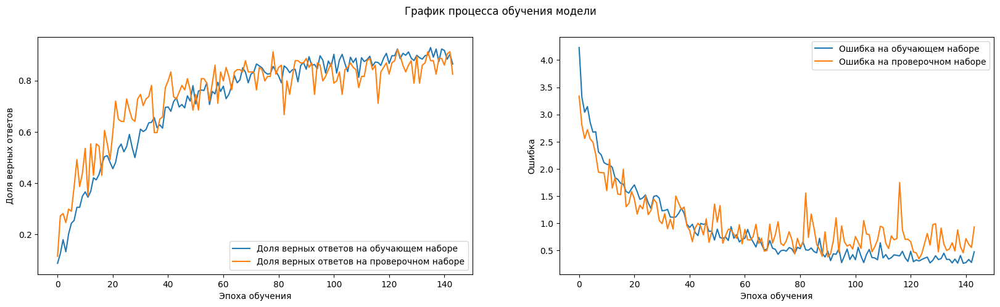

In [ ]:
# Компиляция и обучение модели на заданных параметрах
# В качестве проверочных используются тестовые данные
compile_train_model(model, 
                    train_generator,
                    validation_generator,
                    epochs=EPOCHS_ADD,
                    checkpoint_path=checkpoint_path,
                    learning_mode='add')

In [24]:
# Загрузка лучшей модели
model = load_best_model('/content/gdrive/MyDrive/Best_model/best_model.h5')

5/5 [==============================] - 1s 278ms/step


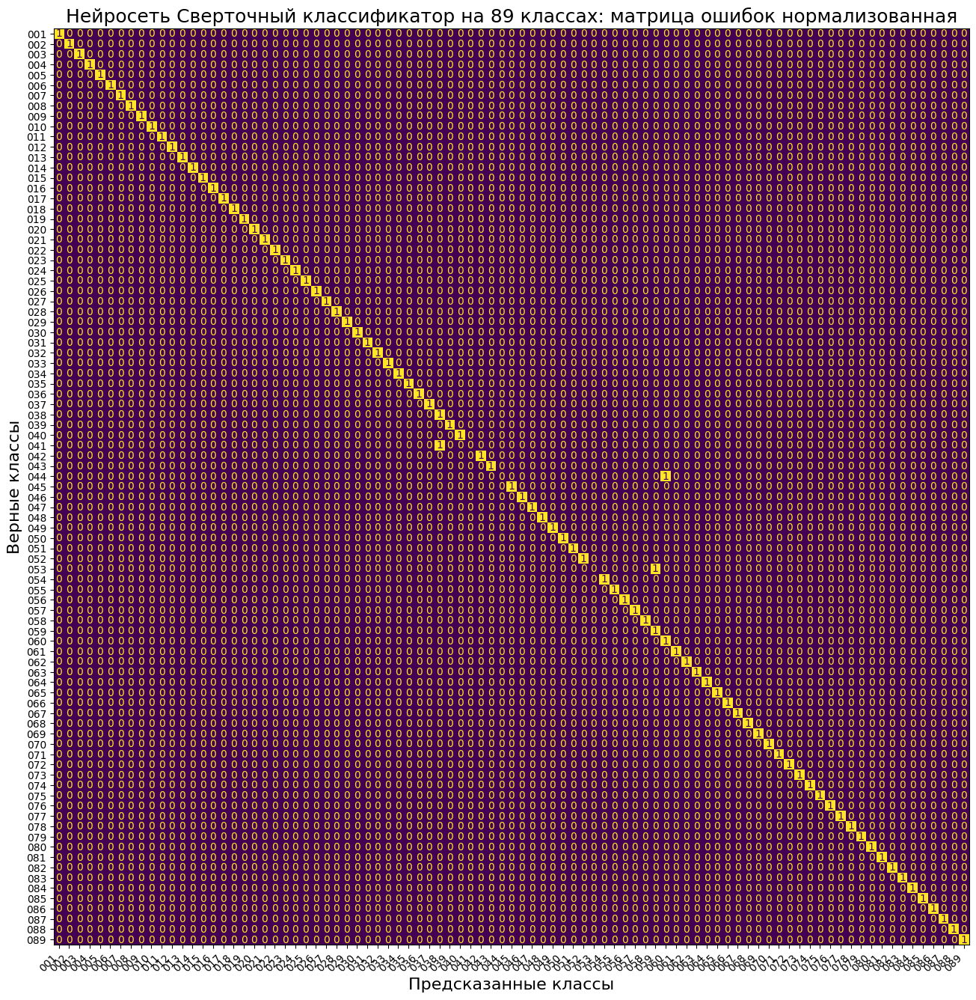

----------------------------------------------------------------------------------------------------
Нейросеть: Сверточный классификатор на 89 классах
Класс: 001                  100% сеть отнесла к классу 001                  - ВЕРНО :-)
Класс: 002                  100% сеть отнесла к классу 002                  - ВЕРНО :-)
Класс: 003                  100% сеть отнесла к классу 003                  - ВЕРНО :-)
Класс: 004                  100% сеть отнесла к классу 004                  - ВЕРНО :-)
Класс: 005                  100% сеть отнесла к классу 005                  - ВЕРНО :-)
Класс: 006                  100% сеть отнесла к классу 006                  - ВЕРНО :-)
Класс: 007                  100% сеть отнесла к классу 007                  - ВЕРНО :-)
Класс: 008                  100% сеть отнесла к классу 008                  - ВЕРНО :-)
Класс: 009                  100% сеть отнесла к классу 009                  - ВЕРНО :-)
Класс: 010                  100% сеть отнесла к классу 01

In [27]:
# Вывод результатов оценки работы модели на тестовых данных

try:
    eval_model(model, test_generator[0][0], test_generator[0][1],
               class_labels=CLASS_LIST, 
               title=f'Сверточный классификатор на {len(CLASS_LIST)} классах',
               figsize=(18, 18))
except Exception as e:
    print('Произошла ошибка:', e)

# Подведение итогов

1. Модифицирован код под production версию.
2. Подготовка данных на 64 класса, создание нейронной модели, обучение на 330 эпохах.
3. Вывод результатов оценки работы модели на тестовых данных.

На тестовой выборке на 64 классах получена **точность разпознавания 98 %**.

4. Добавлено новые 25 классов к первоначальным 64 классам. Итого стало 89 классов.
5. Подготовка данных на 89 классах, до-обучение на 144 эпохах.
6. Вывод результатов оценки работы модели на тестовых данных.

На тестовой выборке на 89 классах получена **точность разпознавания 97 %**.

Итак, на первоначальной базе пациентов (64 класса) и на расширенной базе (+25 классов) получена точность, удовлетворяющая требованиям.

**Требование к точности распознавания классов выполнено: вероятность предсказания класса не ниже 97 %**